
# **Introduction to TorchAudio**






In [ ]:
import torch
import torchaudio
import torchaudio.functional as F
import torchaudio.transforms as T

print(torch.__version__)
print(torchaudio.__version__)

2.1.0+cu121
2.1.0+cu121


# Helper Functions

In [ ]:
def plot_waveform(waveform, sample_rate, title="Waveform", xlim=None):
    waveform = waveform.numpy()

    num_channels, num_frames = waveform.shape
    time_axis = torch.arange(0, num_frames) / sample_rate

    figure, axes = plt.subplots(num_channels, 1)
    if num_channels == 1:
        axes = [axes]
    for c in range(num_channels):
        axes[c].plot(time_axis, waveform[c], linewidth=1)
        axes[c].grid(True)
        if num_channels > 1:
            axes[c].set_ylabel(f"Channel {c+1}")
        if xlim:
            axes[c].set_xlim(xlim)
    figure.suptitle(title)
    plt.show(block=False)

In [ ]:
def plot_specgram(waveform, sample_rate, title="Spectrogram", xlim=None):
    waveform = waveform.numpy()

    num_channels, _ = waveform.shape

    figure, axes = plt.subplots(num_channels, 1)
    if num_channels == 1:
        axes = [axes]
    for c in range(num_channels):
        axes[c].specgram(waveform[c], Fs=sample_rate)
        if num_channels > 1:
            axes[c].set_ylabel(f"Channel {c+1}")
        if xlim:
            axes[c].set_xlim(xlim)
    figure.suptitle(title)
    plt.show(block=False)

In [ ]:
def _hide_seek(obj):
    class _wrapper:
        def __init__(self, obj):
            self.obj = obj

        def read(self, n):
            return self.obj.read(n)

    return _wrapper(obj)

# AUDIO I/O

In this section, we breifly go over  how to use TorchAudio’s basic I/O API to load audio files into PyTorch’s Tensor object, and save Tensor objects to audio files.


For further information, please refer to [the torchaudio
documentation](https://pytorch.org/audio).


## Preparation
First, we import the modules and download the audio assets we use in this tutorial.
When running this tutorial in Google Colab, install the required packages with the following:


```
!pip install boto3
```





In [ ]:
!pip install boto3

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 139.3/139.3 kB 3.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.0/12.0 MB 74.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 82.1/82.1 kB 12.5 MB/s eta 0:00:00


In [ ]:
import io
import os
import tarfile
import tempfile

import boto3
import matplotlib.pyplot as plt
import requests
from botocore import UNSIGNED
from botocore.config import Config
from IPython.display import Audio
from torchaudio.utils import download_asset

SAMPLE_GSM = download_asset("tutorial-assets/steam-train-whistle-daniel_simon.gsm")
SAMPLE_WAV = download_asset("tutorial-assets/Lab41-SRI-VOiCES-src-sp0307-ch127535-sg0042.wav")
SAMPLE_WAV_8000 = download_asset("tutorial-assets/Lab41-SRI-VOiCES-src-sp0307-ch127535-sg0042-8000hz.wav")

100%|██████████| 7.99k/7.99k [00:00<00:00, 13.5MB/s]
100%|██████████| 106k/106k [00:00<00:00, 278kB/s] 
100%|██████████| 53.2k/53.2k [00:00<00:00, 274kB/s] 


## Querying audio metadata

Function torchaudio.info() fetches audio metadata. You can provide a path-like object or file-like object.

In [ ]:
metadata = torchaudio.info(SAMPLE_WAV)
print(metadata)
metadata = torchaudio.info(SAMPLE_GSM)
print(metadata)

AudioMetaData(sample_rate=16000, num_frames=54400, num_channels=1, bits_per_sample=16, encoding=PCM_S)
AudioMetaData(sample_rate=8000, num_frames=39680, num_channels=1, bits_per_sample=0, encoding=GSM)


In [ ]:
url = "https://download.pytorch.org/torchaudio/tutorial-assets/steam-train-whistle-daniel_simon.wav"
with requests.get(url, stream=True) as response:
   metadata = torchaudio.info(_hide_seek(response.raw))
print(metadata)

AudioMetaData(sample_rate=44100, num_frames=109368, num_channels=2, bits_per_sample=16, encoding=PCM_S)


Where

-  ``sample_rate`` is the sampling rate of the audio
-  ``num_channels`` is the number of channels
-  ``num_frames`` is the number of frames per channel
-  ``bits_per_sample`` is bit depth
-  ``encoding`` is the sample coding format

``encoding`` can take on one of the following values:

-  ``"PCM_S"``: Signed integer linear PCM
-  ``"PCM_U"``: Unsigned integer linear PCM
-  ``"PCM_F"``: Floating point linear PCM
-  ``"FLAC"``: Flac, [Free Lossless Audio
   Codec](https://xiph.org/flac/)_
-  ``"ULAW"``: Mu-law,
   [[wikipedia](https://en.wikipedia.org/wiki/%CE%9C-law_algorithm)_]
-  ``"ALAW"``: A-law
   [[wikipedia](https://en.wikipedia.org/wiki/A-law_algorithm)_]
-  ``"MP3"`` : MP3, MPEG-1 Audio Layer III
-  ``"VORBIS"``: OGG Vorbis [[xiph.org](https://xiph.org/vorbis/)_]
-  ``"AMR_NB"``: Adaptive Multi-Rate
   [[wikipedia](https://en.wikipedia.org/wiki/Adaptive_Multi-Rate_audio_codec)_]
-  ``"AMR_WB"``: Adaptive Multi-Rate Wideband
   [[wikipedia](https://en.wikipedia.org/wiki/Adaptive_Multi-Rate_Wideband)_]
-  ``"OPUS"``: Opus [[opus-codec.org](https://opus-codec.org/)_]
-  ``"GSM"``: GSM-FR
   [[wikipedia](https://en.wikipedia.org/wiki/Full_Rate)_]
-  ``"HTK"``: Single channel 16-bit PCM
-  ``"UNKNOWN"`` None of above

## Loading audio data


To load audio data, you can use :py:func:`torchaudio.load`.

This function accepts a path-like object or file-like object as input.

The returned value is a tuple of waveform (``Tensor``) and sample rate
(``int``).

By default, the resulting tensor object has ``dtype=torch.float32`` and
its value range is ``[-1.0, 1.0]``.

In [ ]:
waveform, sample_rate = torchaudio.load(SAMPLE_WAV)

In [ ]:
print(f"num of frames:{waveform.shape[1]} , num_channels:{waveform.shape[0]}, sample_rate:{sample_rate} ")

num of frames:54400 , num_channels:1, sample_rate:16000 


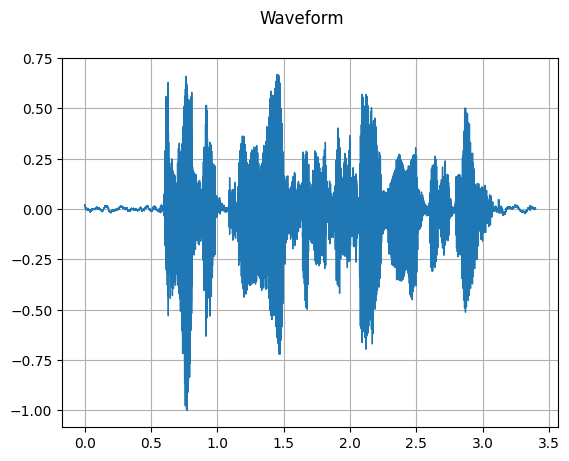

In [ ]:
plot_waveform(waveform, sample_rate)

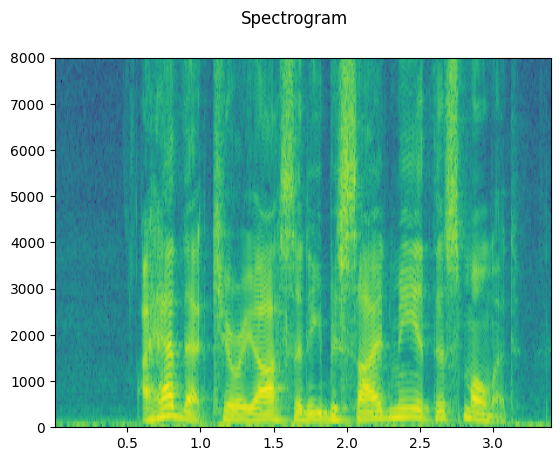

In [ ]:
plot_specgram(waveform, sample_rate)

In [ ]:
Audio(waveform.numpy()[0], rate=sample_rate)

### Loading from file-like object
The I/O functions support file-like objects. This allows for fetching and decoding audio data from locations within and beyond the local file system. The following examples illustrate this.

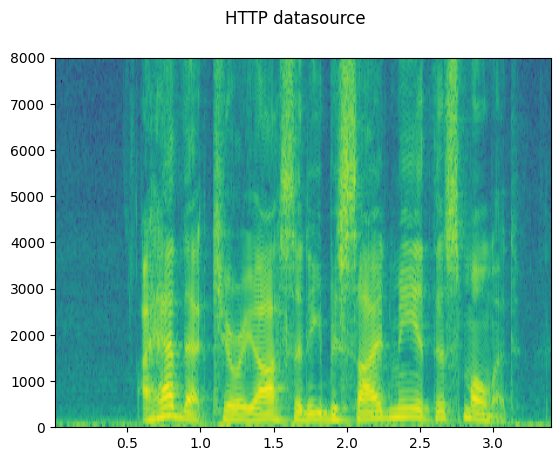

In [ ]:
# Load audio data as HTTP request
url = "https://download.pytorch.org/torchaudio/tutorial-assets/Lab41-SRI-VOiCES-src-sp0307-ch127535-sg0042.wav"
with requests.get(url, stream=True) as response:
    waveform, sample_rate = torchaudio.load(_hide_seek(response.raw))
plot_specgram(waveform, sample_rate, title="HTTP datasource")

100%|██████████| 110k/110k [00:00<00:00, 282kB/s] 


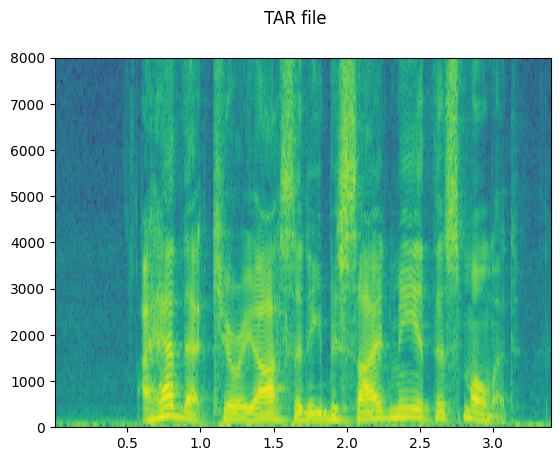

In [ ]:
# Load audio from tar file
tar_path = download_asset("tutorial-assets/VOiCES_devkit.tar.gz")
tar_item = "VOiCES_devkit/source-16k/train/sp0307/Lab41-SRI-VOiCES-src-sp0307-ch127535-sg0042.wav"
with tarfile.open(tar_path, mode="r") as tarfile_:
    fileobj = tarfile_.extractfile(tar_item)
    waveform, sample_rate = torchaudio.load(fileobj)
plot_specgram(waveform, sample_rate, title="TAR file")

## Saving audio to file
To save audio data in formats interpretable by common applications,
you can use :`torchaudio.save`.

This function accepts a path-like object or file-like object.

When passing a file-like object, you also need to provide argument ``format``
so that the function knows which format it should use. In the
case of a path-like object, the function will infer the format from
the extension. If you are saving to a file without an extension, you need
to provide argument ``format``.

When saving WAV-formatted data, the default encoding for ``float32`` Tensor
is 32-bit floating-point PCM. You can provide arguments ``encoding`` and
``bits_per_sample`` to change this behavior. For example, to save data
in 16-bit signed integer PCM, you can do the following.

In [ ]:
waveform, sample_rate = torchaudio.load(SAMPLE_WAV)

In [ ]:
def inspect_file(path):
    print("-" * 10)
    print("Source:", path)
    print("-" * 10)
    print(f" - File size: {os.path.getsize(path)} bytes")
    print(f" - {torchaudio.info(path)}")
    print()

Save without any encoding option.
The function will pick up the encoding which
the provided data fit



In [ ]:
with tempfile.TemporaryDirectory() as tempdir:
    path = f"{tempdir}/save_example_default.wav"
    torchaudio.save(path, waveform, sample_rate)
    inspect_file(path)

----------
Source: /tmp/tmpz62eavwh/save_example_default.wav
----------
 - File size: 108878 bytes
 - AudioMetaData(sample_rate=16000, num_frames=54400, num_channels=1, bits_per_sample=16, encoding=PCM_S)



torchaudio.save can also handle other formats. To name a few:

In [ ]:
formats = [
    "flac",
    "vorbis",
    "amb",
    "gsm",
]

In [ ]:
waveform, sample_rate = torchaudio.load(SAMPLE_WAV_8000)
with tempfile.TemporaryDirectory() as tempdir:
    for format in formats:
        path = f"{tempdir}/save_example.{format}"
        torchaudio.save(path, waveform, sample_rate, format=format)
        inspect_file(path)

----------
Source: /tmp/tmpqcc9nquz/save_example.flac
----------
 - File size: 45264 bytes
 - AudioMetaData(sample_rate=8000, num_frames=27200, num_channels=1, bits_per_sample=16, encoding=FLAC)

----------
Source: /tmp/tmpqcc9nquz/save_example.vorbis
----------
 - File size: 19253 bytes
 - AudioMetaData(sample_rate=8000, num_frames=26624, num_channels=2, bits_per_sample=0, encoding=VORBIS)

----------
Source: /tmp/tmpqcc9nquz/save_example.amb
----------
 - File size: 54478 bytes
 - AudioMetaData(sample_rate=8000, num_frames=27200, num_channels=1, bits_per_sample=16, encoding=PCM_S)

----------
Source: /tmp/tmpqcc9nquz/save_example.gsm
----------
 - File size: 5610 bytes
 - AudioMetaData(sample_rate=8000, num_frames=27200, num_channels=1, bits_per_sample=0, encoding=GSM)



# AUDIO RESAMPLING

This section shows how to use torchaudio’s resampling API.



## Preparation

First, we import the modules and define the helper functions.

In [ ]:
import math
import time

import librosa
import matplotlib.pyplot as plt
import pandas as pd
from IPython.display import Audio, display

pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

DEFAULT_OFFSET = 201


def _get_log_freq(sample_rate, max_sweep_rate, offset):
    """Get freqs evenly spaced out in log-scale, between [0, max_sweep_rate // 2]

    offset is used to avoid negative infinity `log(offset + x)`.

    """
    start, stop = math.log(offset), math.log(offset + max_sweep_rate // 2)
    return torch.exp(torch.linspace(start, stop, sample_rate, dtype=torch.double)) - offset


def _get_inverse_log_freq(freq, sample_rate, offset):
    """Find the time where the given frequency is given by _get_log_freq"""
    half = sample_rate // 2
    return sample_rate * (math.log(1 + freq / offset) / math.log(1 + half / offset))


def _get_freq_ticks(sample_rate, offset, f_max):
    # Given the original sample rate used for generating the sweep,
    # find the x-axis value where the log-scale major frequency values fall in
    time, freq = [], []
    for exp in range(2, 5):
        for v in range(1, 10):
            f = v * 10**exp
            if f < sample_rate // 2:
                t = _get_inverse_log_freq(f, sample_rate, offset) / sample_rate
                time.append(t)
                freq.append(f)
    t_max = _get_inverse_log_freq(f_max, sample_rate, offset) / sample_rate
    time.append(t_max)
    freq.append(f_max)
    return time, freq


def get_sine_sweep(sample_rate, offset=DEFAULT_OFFSET):
    max_sweep_rate = sample_rate
    freq = _get_log_freq(sample_rate, max_sweep_rate, offset)
    delta = 2 * math.pi * freq / sample_rate
    cummulative = torch.cumsum(delta, dim=0)
    signal = torch.sin(cummulative).unsqueeze(dim=0)
    return signal


def plot_sweep(
    waveform,
    sample_rate,
    title,
    max_sweep_rate=48000,
    offset=DEFAULT_OFFSET,
):
    x_ticks = [100, 500, 1000, 5000, 10000, 20000, max_sweep_rate // 2]
    y_ticks = [1000, 5000, 10000, 20000, sample_rate // 2]

    time, freq = _get_freq_ticks(max_sweep_rate, offset, sample_rate // 2)
    freq_x = [f if f in x_ticks and f <= max_sweep_rate // 2 else None for f in freq]
    freq_y = [f for f in freq if f in y_ticks and 1000 <= f <= sample_rate // 2]

    figure, axis = plt.subplots(1, 1)
    _, _, _, cax = axis.specgram(waveform[0].numpy(), Fs=sample_rate)
    plt.xticks(time, freq_x)
    plt.yticks(freq_y, freq_y)
    axis.set_xlabel("Original Signal Frequency (Hz, log scale)")
    axis.set_ylabel("Waveform Frequency (Hz)")
    axis.xaxis.grid(True, alpha=0.67)
    axis.yaxis.grid(True, alpha=0.67)
    figure.suptitle(f"{title} (sample rate: {sample_rate} Hz)")
    plt.colorbar(cax)
    plt.show(block=True)

## Resampling Overview

To resample an audio waveform from one freqeuncy to another, you can use
:py:func:`torchaudio.transforms.Resample` or
:py:func:`torchaudio.functional.resample`.
``transforms.Resample`` precomputes and caches the kernel used for resampling,
while ``functional.resample`` computes it on the fly, so using
``torchaudio.transforms.Resample`` will result in a speedup when resampling
multiple waveforms using the same parameters.


Both resampling methods use [bandlimited sinc
interpolation](https://ccrma.stanford.edu/~jos/resample/)_ to compute
signal values at arbitrary time steps. The implementation involves
convolution, so we can take advantage of GPU / multithreading for
performance improvements.

Because a finite number of samples can only represent a finite number of
frequencies, resampling does not produce perfect results, and a variety
of parameters can be used to control for its quality and computational
speed. We demonstrate these properties through resampling a logarithmic
sine sweep, which is a sine wave that increases exponentially in
frequency over time.

The spectrograms below show the frequency representation of the signal,
where the x-axis corresponds to the frequency of the original
waveform (in log scale), y-axis the frequency of the
plotted waveform, and color intensity the amplitude.

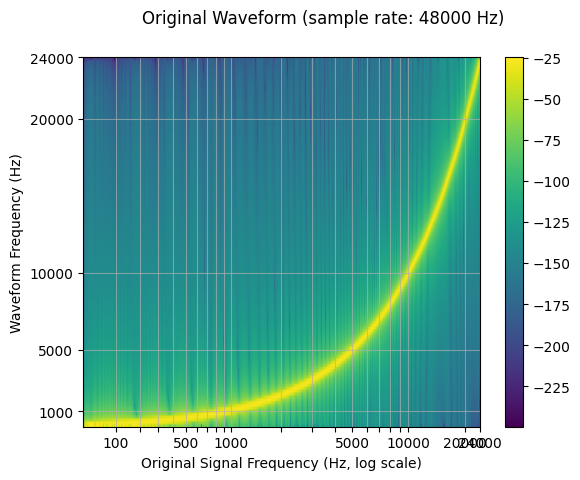

In [ ]:
sample_rate = 48000
waveform = get_sine_sweep(sample_rate)

plot_sweep(waveform, sample_rate, title="Original Waveform")
Audio(waveform.numpy()[0], rate=sample_rate)

Now we resample (downsample) it.

We see that in the spectrogram of the resampled waveform, there is an
artifact, which was not present in the original waveform.

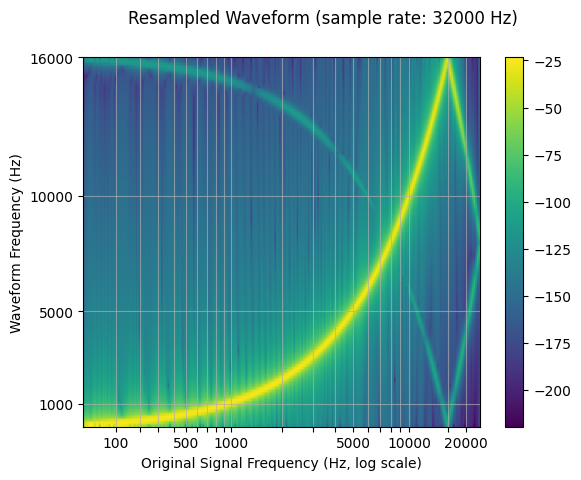

In [ ]:
resample_rate = 32000
resampler = T.Resample(sample_rate, resample_rate, dtype=waveform.dtype)
resampled_waveform = resampler(waveform)

plot_sweep(resampled_waveform, resample_rate, title="Resampled Waveform")
Audio(resampled_waveform.numpy()[0], rate=resample_rate)

## Controling resampling quality with parameters

### Lowpass filter width

Because the filter used for interpolation extends infinitely, the
``lowpass_filter_width`` parameter is used to control for the width of
the filter to use to window the interpolation. It is also referred to as
the number of zero crossings, since the interpolation passes through
zero at every time unit. Using a larger ``lowpass_filter_width``
provides a sharper, more precise filter, but is more computationally
expensive.


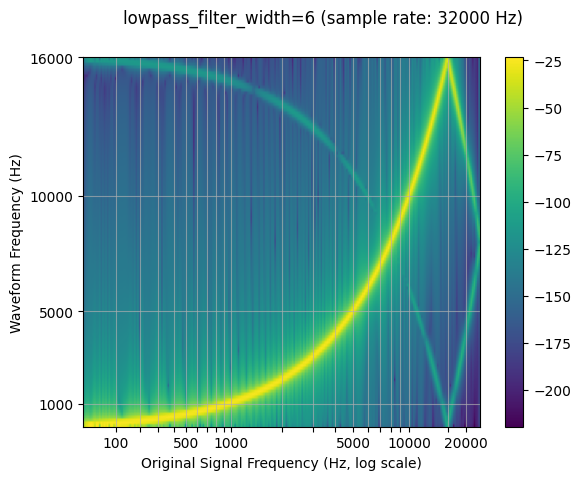

In [ ]:
sample_rate = 48000
resample_rate = 32000

resampled_waveform = F.resample(waveform, sample_rate, resample_rate, lowpass_filter_width=6)
plot_sweep(resampled_waveform, resample_rate, title="lowpass_filter_width=6")
Audio(resampled_waveform[0], rate=resample_rate)

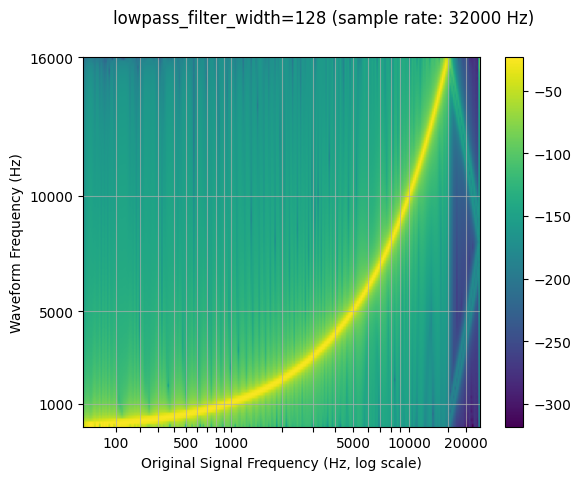

In [ ]:
resampled_waveform = F.resample(waveform, sample_rate, resample_rate, lowpass_filter_width=128)
plot_sweep(resampled_waveform, resample_rate, title="lowpass_filter_width=128")

### Rolloff

The ``rolloff`` parameter is represented as a fraction of the Nyquist
frequency, which is the maximal frequency representable by a given
finite sample rate. ``rolloff`` determines the lowpass filter cutoff and
controls the degree of aliasing, which takes place when frequencies
higher than the Nyquist are mapped to lower frequencies. A lower rolloff
will therefore reduce the amount of aliasing, but it will also reduce
some of the higher frequencies.


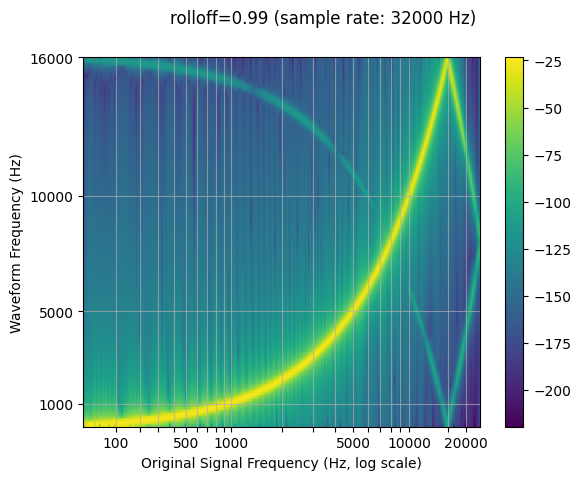

In [ ]:
sample_rate = 48000
resample_rate = 32000

resampled_waveform = F.resample(waveform, sample_rate, resample_rate, rolloff=0.99)
plot_sweep(resampled_waveform, resample_rate, title="rolloff=0.99")

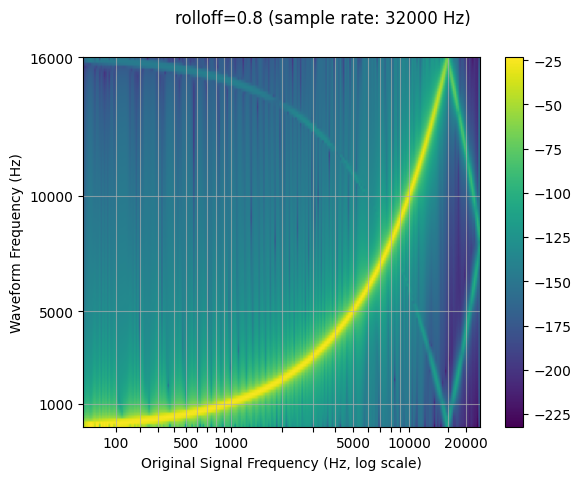

In [ ]:
resampled_waveform = F.resample(waveform, sample_rate, resample_rate, rolloff=0.8)
plot_sweep(resampled_waveform, resample_rate, title="rolloff=0.8")

### Window function

By default, ``torchaudio``’s resample uses the Hann window filter, which is
a weighted cosine function. It additionally supports the Kaiser window,
which is a near optimal window function that contains an additional
``beta`` parameter that allows for the design of the smoothness of the
filter and width of impulse. This can be controlled using the
``resampling_method`` parameter.



/usr/local/lib/python3.10/dist-packages/torchaudio/functional/functional.py:1371: UserWarning: "sinc_interpolation" resampling method name is being deprecated and replaced by "sinc_interp_hann" in the next release. The default behavior remains unchanged.
  warnings.warn(


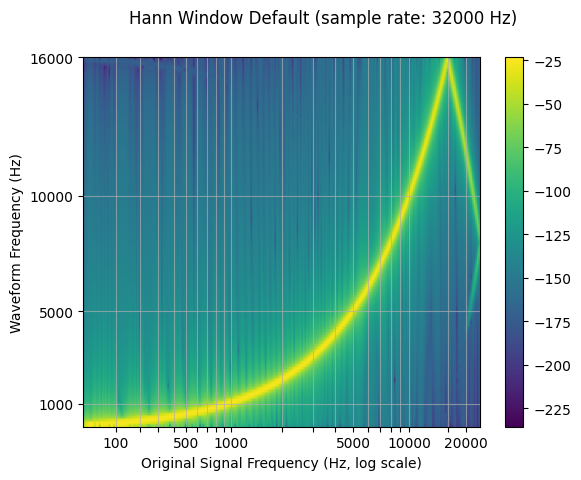

In [ ]:
sample_rate = 48000
resample_rate = 32000

resampled_waveform = F.resample(waveform, sample_rate, resample_rate, resampling_method="sinc_interpolation")
plot_sweep(resampled_waveform, resample_rate, title="Hann Window Default")

/usr/local/lib/python3.10/dist-packages/torchaudio/functional/functional.py:1371: UserWarning: "kaiser_window" resampling method name is being deprecated and replaced by "sinc_interp_kaiser" in the next release. The default behavior remains unchanged.
  warnings.warn(


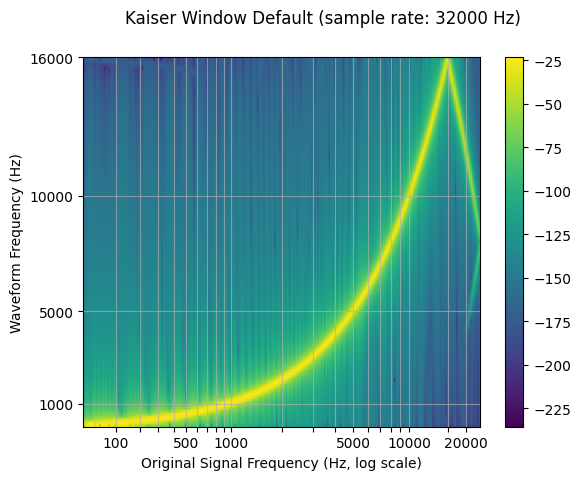

In [ ]:
resampled_waveform = F.resample(waveform, sample_rate, resample_rate, resampling_method="kaiser_window")
plot_sweep(resampled_waveform, resample_rate, title="Kaiser Window Default")

# AUDIO DATA AUGMENTATION


``torchaudio`` provides a variety of ways to augment audio data.

In this tutorial, we look into a way to apply effects, filters,
RIR (room impulse response) and codecs.

At the end, we synthesize noisy speech over phone from clean speech.


## Preparation

First, we import the modules and download the audio assets we use in this tutorial.

In [ ]:
import math

from IPython.display import Audio
import matplotlib.pyplot as plt

from torchaudio.utils import download_asset

SAMPLE_WAV = download_asset("tutorial-assets/steam-train-whistle-daniel_simon.wav")
SAMPLE_RIR = download_asset("tutorial-assets/Lab41-SRI-VOiCES-rm1-impulse-mc01-stu-clo-8000hz.wav")
SAMPLE_SPEECH = download_asset("tutorial-assets/Lab41-SRI-VOiCES-src-sp0307-ch127535-sg0042-8000hz.wav")
SAMPLE_NOISE = download_asset("tutorial-assets/Lab41-SRI-VOiCES-rm1-babb-mc01-stu-clo-8000hz.wav")

100%|██████████| 427k/427k [00:00<00:00, 551kB/s]
100%|██████████| 31.3k/31.3k [00:00<00:00, 162kB/s]
100%|██████████| 78.2k/78.2k [00:00<00:00, 201kB/s]


## Applying effects and filtering

`torchaudio.io.AudioEffector` allows for directly applying filters and codecs to Tensor objects, in a similar way as ffmpeg command


In [ ]:
# Load the data
waveform1, sample_rate = torchaudio.load(SAMPLE_WAV, channels_first=False)

# Define effects
effect = ",".join(
    [
        "lowpass=frequency=300:poles=1",  # apply single-pole lowpass filter
        "atempo=0.8",  # reduce the speed
        "aecho=in_gain=0.8:out_gain=0.9:delays=200:decays=0.3|delays=400:decays=0.3"
        # Applying echo gives some dramatic feeling
    ],
)


# Apply effects
def apply_effect(waveform, sample_rate, effect):
    effector = torchaudio.io.AudioEffector(effect=effect)
    return effector.apply(waveform, sample_rate)
waveform2 = apply_effect(waveform1, sample_rate, effect)

print("Original")
print(waveform1.shape, sample_rate)

print("Effects applied")
print(waveform2.shape, sample_rate)

Original
torch.Size([109368, 2]) 44100
Effects applied
torch.Size([144642, 2]) 44100


### Original:


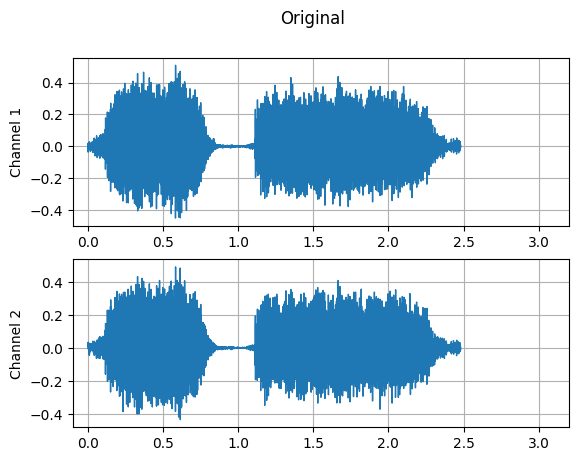

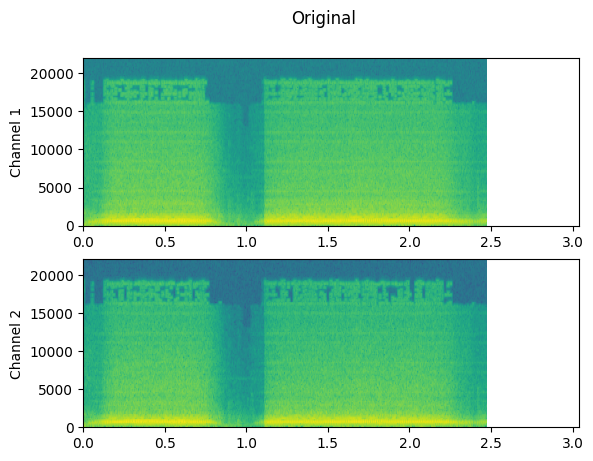

In [ ]:
plot_waveform(waveform1.T, sample_rate, title="Original", xlim=(-0.1, 3.2))
plot_specgram(waveform1.T, sample_rate, title="Original", xlim=(0, 3.04))
Audio(waveform1.T, rate=sample_rate)

### Effects applied:

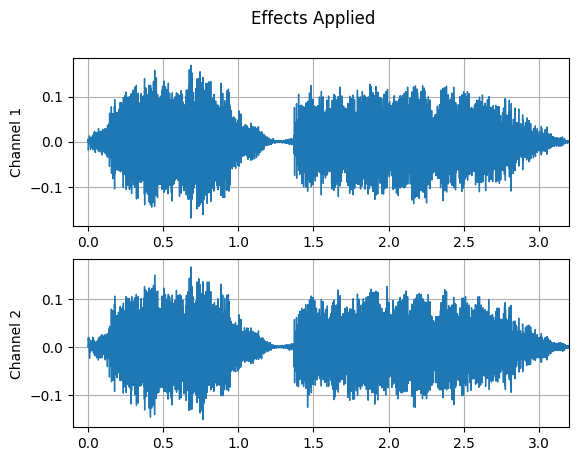

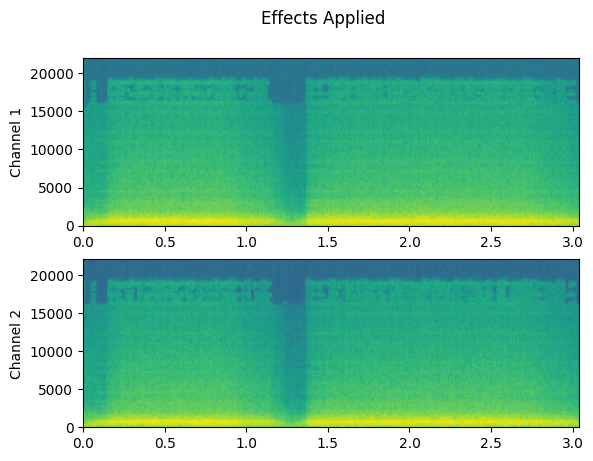

In [ ]:
plot_waveform(waveform2.T, sample_rate, title="Effects Applied", xlim=(-0.1, 3.2))
plot_specgram(waveform2.T, sample_rate, title="Effects Applied", xlim=(0, 3.04))
Audio(waveform2.T, rate=sample_rate)

## Simulating room reverberation

[Convolution
reverb](https://en.wikipedia.org/wiki/Convolution_reverb)_ is a
technique that's used to make clean audio sound as though it has been
produced in a different environment.

Using Room Impulse Response (RIR), for instance, we can make clean speech
sound as though it has been uttered in a conference room.

For this process, we need RIR data. The following data are from the VOiCES
dataset, but you can record your own — just turn on your microphone
and clap your hands.


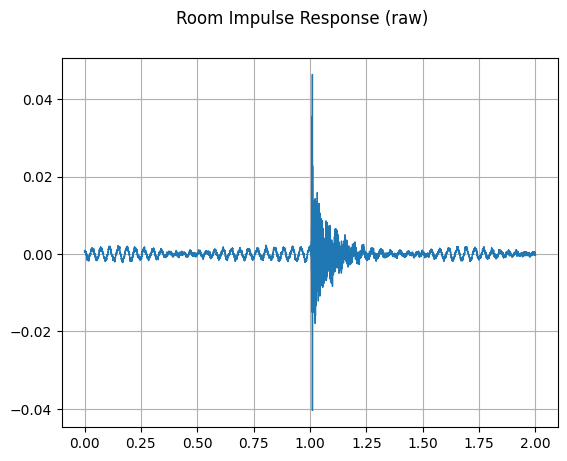

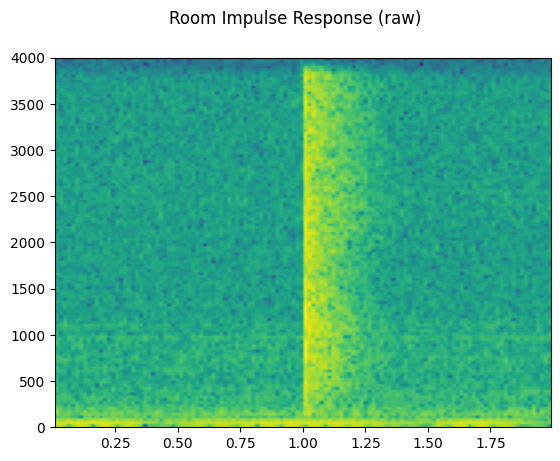

In [ ]:
rir_raw, sample_rate = torchaudio.load(SAMPLE_RIR)
plot_waveform(rir_raw, sample_rate, title="Room Impulse Response (raw)")
plot_specgram(rir_raw, sample_rate, title="Room Impulse Response (raw)")
Audio(rir_raw, rate=sample_rate)

First, we need to clean up the RIR. We extract the main impulse, normalize
the signal power, then flip along the time axis.


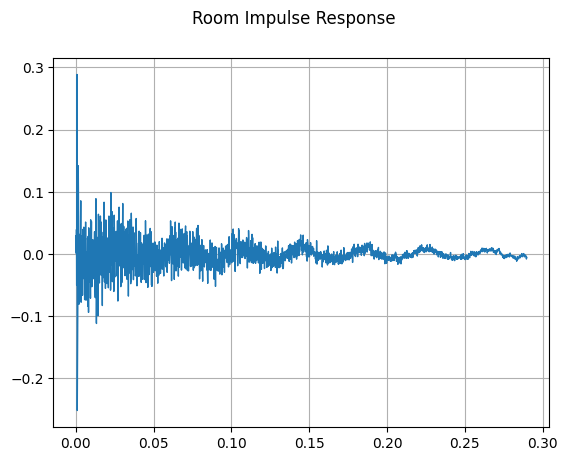

In [ ]:
rir = rir_raw[:, int(sample_rate * 1.01) : int(sample_rate * 1.3)]
rir = rir / torch.norm(rir, p=2)
RIR = torch.flip(rir, [1])

plot_waveform(rir, sample_rate, title="Room Impulse Response")

Then, we convolve the speech signal with the RIR filter.


In [ ]:
speech, _ = torchaudio.load(SAMPLE_SPEECH)

speech_ = torch.nn.functional.pad(speech, (RIR.shape[1] - 1, 0))
augmented = torch.nn.functional.conv1d(speech_[None, ...], RIR[None, ...])[0]

### Original:


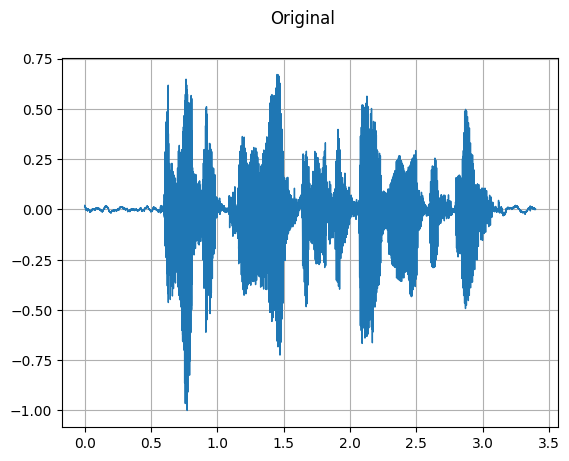

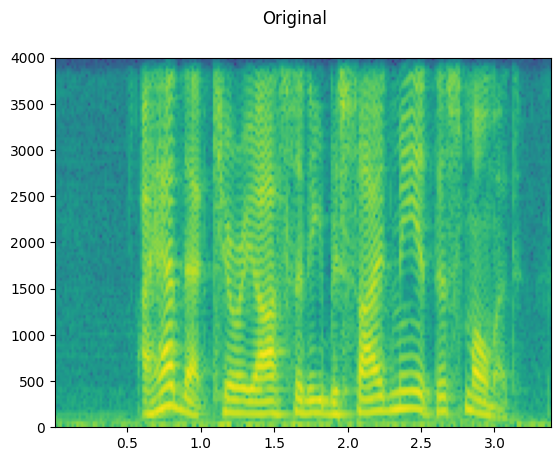

In [ ]:
plot_waveform(speech, sample_rate, title="Original")
plot_specgram(speech, sample_rate, title="Original")
Audio(speech, rate=sample_rate)

### RIR applied:


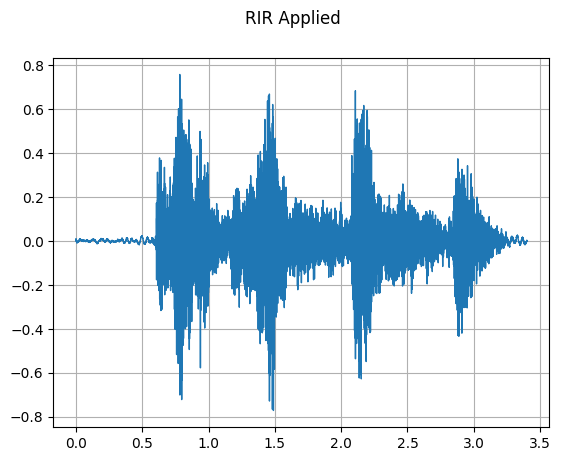

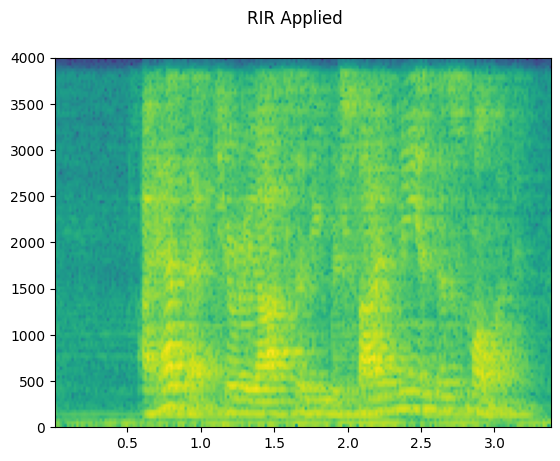

In [ ]:
plot_waveform(augmented, sample_rate, title="RIR Applied")
plot_specgram(augmented, sample_rate, title="RIR Applied")
Audio(augmented, rate=sample_rate)

## Adding background noise

To add background noise to audio data, you can simply add a noise Tensor to
the Tensor representing the audio data. A common method to adjust the
intensity of noise is changing the Signal-to-Noise Ratio (SNR).
[[wikipedia](https://en.wikipedia.org/wiki/Signal-to-noise_ratio)_]

$$ \mathrm{SNR} = \frac{P_{signal}}{P_{noise}} $$

$$ \mathrm{SNR_{dB}} = 10 \log _{{10}} \mathrm {SNR} $$


In [ ]:
speech, _ = torchaudio.load(SAMPLE_SPEECH)
noise, _ = torchaudio.load(SAMPLE_NOISE)
noise = noise[:, : speech.shape[1]]

speech_rms = speech.norm(p=2)
noise_rms = noise.norm(p=2)

snr_dbs = [20, 10, 3]
noisy_speeches = []
for snr_db in snr_dbs:
    snr = 10 ** (snr_db / 20)
    scale = snr * noise_rms / speech_rms
    noisy_speeches.append((scale * speech + noise) / 2)

### Background noise:


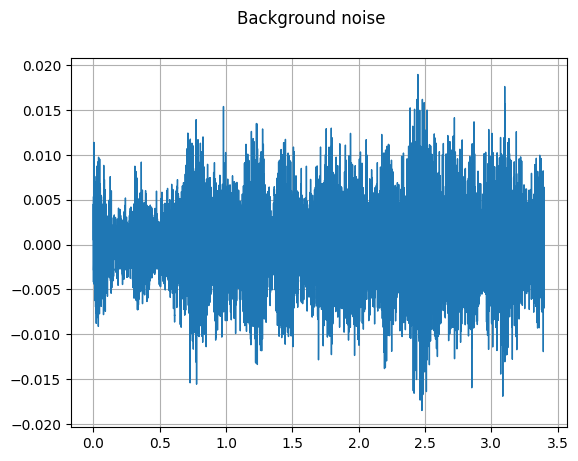

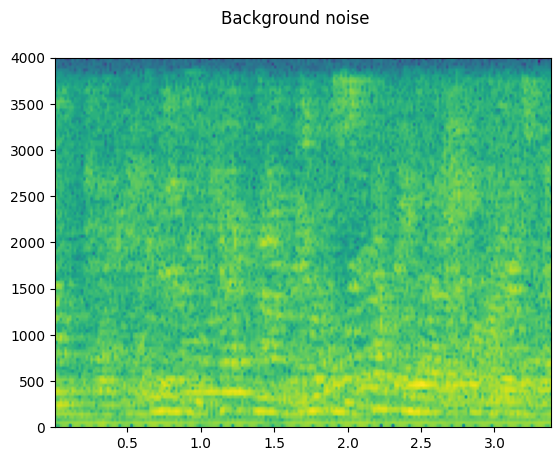

In [ ]:
plot_waveform(noise, sample_rate, title="Background noise")
plot_specgram(noise, sample_rate, title="Background noise")
Audio(noise, rate=sample_rate)

### SNR 20 dB:

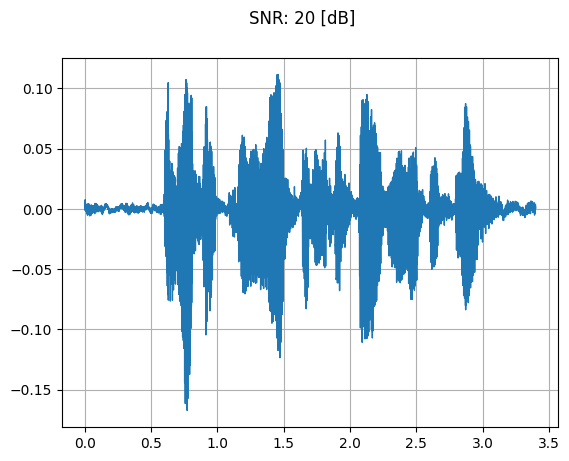

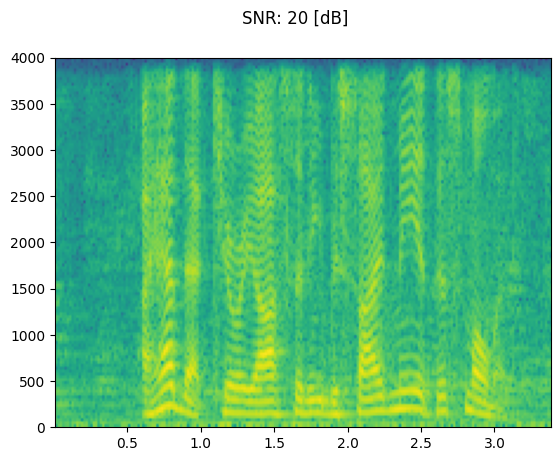

In [ ]:
snr_db, noisy_speech = snr_dbs[0], noisy_speeches[0]
plot_waveform(noisy_speech, sample_rate, title=f"SNR: {snr_db} [dB]")
plot_specgram(noisy_speech, sample_rate, title=f"SNR: {snr_db} [dB]")
Audio(noisy_speech, rate=sample_rate)

### SNR 10 dB:

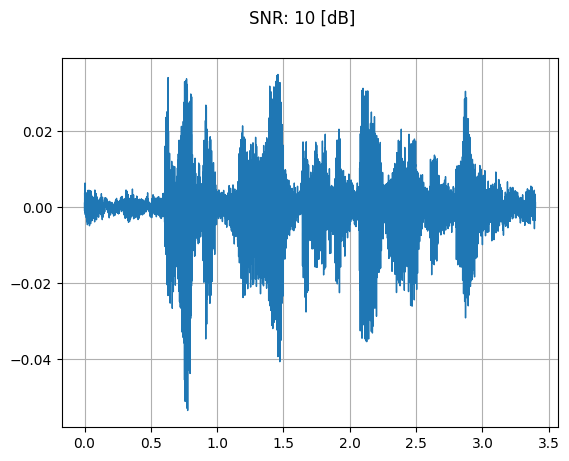

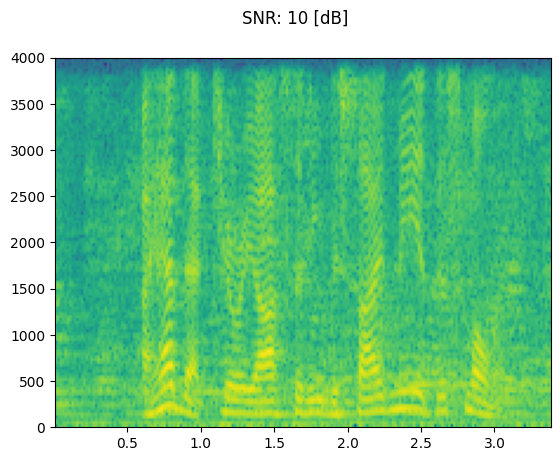

In [ ]:
snr_db, noisy_speech = snr_dbs[1], noisy_speeches[1]
plot_waveform(noisy_speech, sample_rate, title=f"SNR: {snr_db} [dB]")
plot_specgram(noisy_speech, sample_rate, title=f"SNR: {snr_db} [dB]")
Audio(noisy_speech, rate=sample_rate)

### SNR 3 dB:

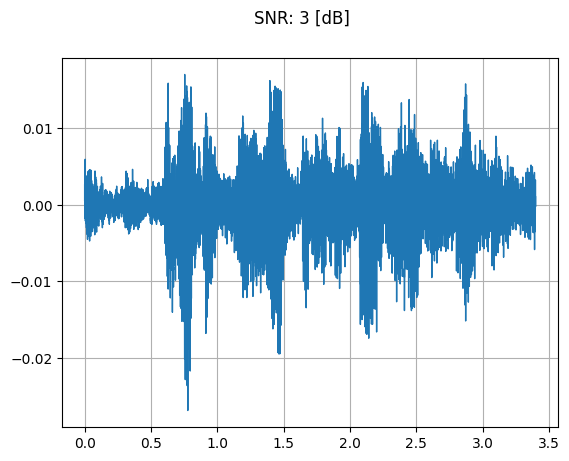

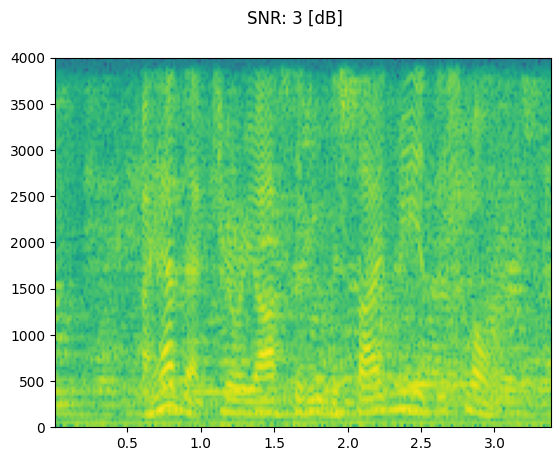

In [ ]:
snr_db, noisy_speech = snr_dbs[2], noisy_speeches[2]
plot_waveform(noisy_speech, sample_rate, title=f"SNR: {snr_db} [dB]")
plot_specgram(noisy_speech, sample_rate, title=f"SNR: {snr_db} [dB]")
Audio(noisy_speech, rate=sample_rate)

# AUDIO FEATURE EXTRACTIONS


``torchaudio`` implements feature extractions commonly used in the audio
domain. They are available in ``torchaudio.functional`` and
``torchaudio.transforms``.

``functional`` implements features as standalone functions.
They are stateless.

``transforms`` implements features as objects,
using implementations from ``functional`` and ``torch.nn.Module``.
They can be serialized using TorchScript.


## Prepration

In [ ]:
from IPython.display import Audio
import librosa
import matplotlib.pyplot as plt
from torchaudio.utils import download_asset

torch.random.manual_seed(0)

SAMPLE_SPEECH = download_asset("tutorial-assets/Lab41-SRI-VOiCES-src-sp0307-ch127535-sg0042.wav")

def plot_spectrogram(specgram, title=None, ylabel="freq_bin"):
    fig, axs = plt.subplots(1, 1)
    axs.set_title(title or "Spectrogram (db)")
    axs.set_ylabel(ylabel)
    axs.set_xlabel("frame")
    im = axs.imshow(librosa.power_to_db(specgram), origin="lower", aspect="auto")
    fig.colorbar(im, ax=axs)
    plt.show(block=False)


def plot_fbank(fbank, title=None):
    fig, axs = plt.subplots(1, 1)
    axs.set_title(title or "Filter bank")
    axs.imshow(fbank, aspect="auto")
    axs.set_ylabel("frequency bin")
    axs.set_xlabel("mel bin")
    plt.show(block=False)

## Overview of audio features

The following diagram shows the relationship between common audio features
and torchaudio APIs to generate them.

<img src="https://download.pytorch.org/torchaudio/tutorial-assets/torchaudio_feature_extractions.png">

For the complete list of available features, please refer to the
documentation.


## Spectrogram

To get the frequency make-up of an audio signal as it varies with time,
you can use :py:func:`torchaudio.transforms.Spectrogram`.

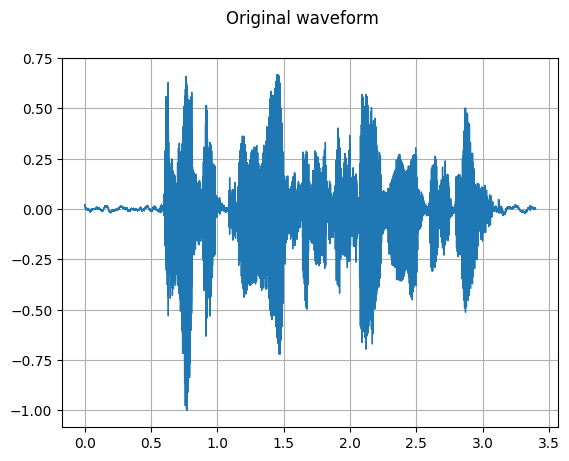

In [ ]:
SPEECH_WAVEFORM, SAMPLE_RATE = torchaudio.load(SAMPLE_SPEECH)

plot_waveform(SPEECH_WAVEFORM, SAMPLE_RATE, title="Original waveform")
Audio(SPEECH_WAVEFORM.numpy(), rate=SAMPLE_RATE)

In [ ]:
n_fft = 1024
win_length = None
hop_length = 512

# Define transform
spectrogram = T.Spectrogram(
    n_fft=n_fft,
    win_length=win_length,
    hop_length=hop_length,
    center=True,
    pad_mode="reflect",
    power=2.0,
)

In [ ]:
# Perform transform
spec = spectrogram(SPEECH_WAVEFORM)

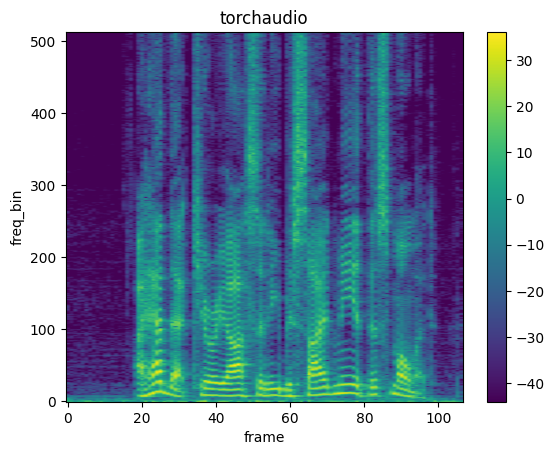

In [ ]:
plot_spectrogram(spec[0], title="torchaudio")

## GriffinLim

To recover a waveform from a spectrogram, you can use ``GriffinLim``.
Note:  This techniques distorts the waverform quite a bit and there exists a more modern approach to switch from spectrograms to waveforms with a neural network called vocoder.

In [ ]:
torch.random.manual_seed(0)

n_fft = 1024
win_length = None
hop_length = 512

spec = T.Spectrogram(
    n_fft=n_fft,
    win_length=win_length,
    hop_length=hop_length,
)(SPEECH_WAVEFORM)

In [ ]:
griffin_lim = T.GriffinLim(
    n_fft=n_fft,
    win_length=win_length,
    hop_length=hop_length,
)

In [ ]:
reconstructed_waveform = griffin_lim(spec)

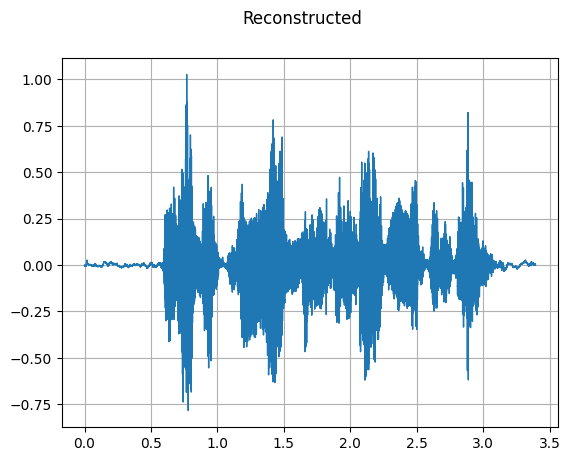

In [ ]:
plot_waveform(reconstructed_waveform, SAMPLE_RATE, title="Reconstructed")
Audio(reconstructed_waveform, rate=SAMPLE_RATE)

## Mel Filter Bank

:py:func:`torchaudio.functional.melscale_fbanks` generates the filter bank
for converting frequency bins to mel-scale bins.

Since this function does not require input audio/features, there is no
equivalent transform in :py:func:`torchaudio.transforms`.

In [ ]:
n_fft = 256
n_mels = 64
sample_rate = 6000

mel_filters = F.melscale_fbanks(
    int(n_fft // 2 + 1),
    n_mels=n_mels,
    f_min=0.0,
    f_max=sample_rate / 2.0,
    sample_rate=sample_rate,
    norm="slaney",
)

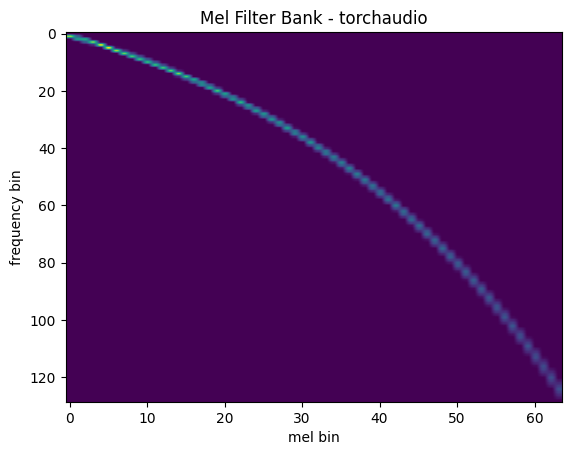

In [ ]:
plot_fbank(mel_filters, "Mel Filter Bank - torchaudio")

## MelSpectrogram

Generating a mel-scale spectrogram involves generating a spectrogram
and performing mel-scale conversion. In ``torchaudio``,
:py:func:`torchaudio.transforms.MelSpectrogram` provides
this functionality.


In [ ]:
n_fft = 1024
win_length = None
hop_length = 512
n_mels = 128

mel_spectrogram = T.MelSpectrogram(
    sample_rate=sample_rate,
    n_fft=n_fft,
    win_length=win_length,
    hop_length=hop_length,
    center=True,
    pad_mode="reflect",
    power=2.0,
    norm="slaney",
    onesided=True,
    n_mels=n_mels,
    mel_scale="htk",
)

melspec = mel_spectrogram(SPEECH_WAVEFORM)

/usr/local/lib/python3.10/dist-packages/torchaudio/transforms/_transforms.py:580: UserWarning: Argument 'onesided' has been deprecated and has no influence on the behavior of this module.
  warnings.warn(


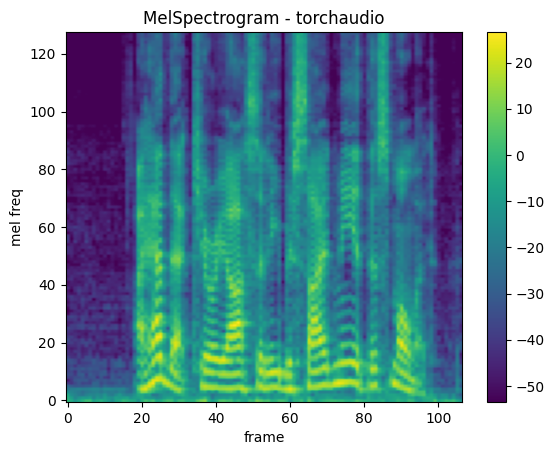

In [ ]:
plot_spectrogram(melspec[0], title="MelSpectrogram - torchaudio", ylabel="mel freq")

## MFCC


In [ ]:
n_fft = 2048
win_length = None
hop_length = 512
n_mels = 256
n_mfcc = 256

mfcc_transform = T.MFCC(
    sample_rate=sample_rate,
    n_mfcc=n_mfcc,
    melkwargs={
        "n_fft": n_fft,
        "n_mels": n_mels,
        "hop_length": hop_length,
        "mel_scale": "htk",
    },
)

mfcc = mfcc_transform(SPEECH_WAVEFORM)

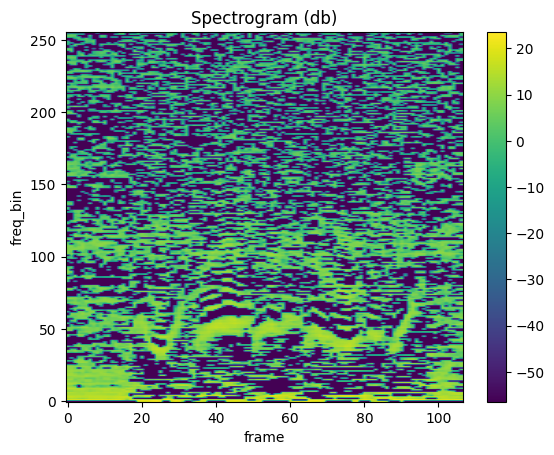

In [ ]:
plot_spectrogram(mfcc[0])

## LFCC


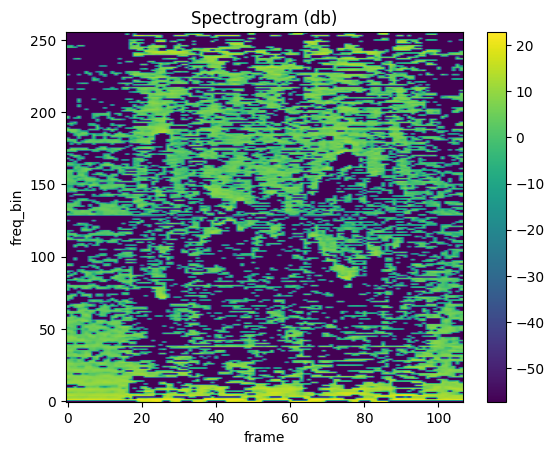

In [ ]:
n_fft = 2048
win_length = None
hop_length = 512
n_lfcc = 256

lfcc_transform = T.LFCC(
    sample_rate=sample_rate,
    n_lfcc=n_lfcc,
    speckwargs={
        "n_fft": n_fft,
        "win_length": win_length,
        "hop_length": hop_length,
    },
)

lfcc = lfcc_transform(SPEECH_WAVEFORM)
plot_spectrogram(lfcc[0])

## Pitch


In [ ]:
pitch = F.detect_pitch_frequency(SPEECH_WAVEFORM, SAMPLE_RATE)

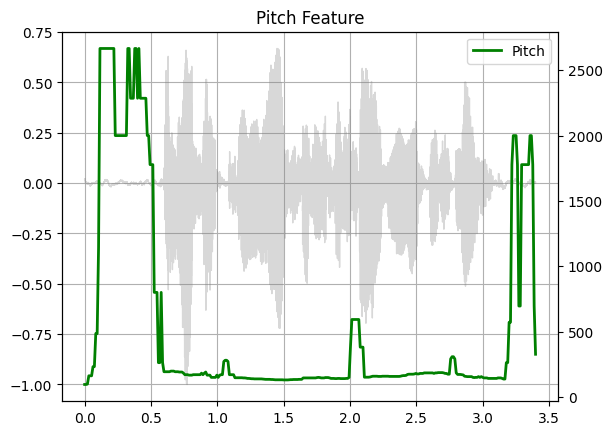

In [ ]:
def plot_pitch(waveform, sr, pitch):
    figure, axis = plt.subplots(1, 1)
    axis.set_title("Pitch Feature")
    axis.grid(True)

    end_time = waveform.shape[1] / sr
    time_axis = torch.linspace(0, end_time, waveform.shape[1])
    axis.plot(time_axis, waveform[0], linewidth=1, color="gray", alpha=0.3)

    axis2 = axis.twinx()
    time_axis = torch.linspace(0, end_time, pitch.shape[1])
    axis2.plot(time_axis, pitch[0], linewidth=2, label="Pitch", color="green")

    axis2.legend(loc=0)
    plt.show(block=False)


plot_pitch(SPEECH_WAVEFORM, SAMPLE_RATE, pitch)

# AUDIO FEATURE AUGMENTATION
[SpecAugment](https://ai.googleblog.com/2019/04/specaugment-new-data-augmentation.html)_
is a popular spectrogram augmentation technique.

``torchaudio`` implements :py:func:`torchaudio.transforms.TimeStretch`,
:py:func:`torchaudio.transforms.TimeMasking` and
:py:func:`torchaudio.transforms.FrequencyMasking`.


## Prepration

In [ ]:
SAMPLE_WAV_SPEECH_PATH = download_asset("tutorial-assets/Lab41-SRI-VOiCES-src-sp0307-ch127535-sg0042.wav")

def get_spectrogram(
    n_fft=400,
    win_len=None,
    hop_len=None,
    power=2.0,
):
    waveform, sample_rate = torchaudio.load(SAMPLE_WAV_SPEECH_PATH)
    spectrogram = T.Spectrogram(
        n_fft=n_fft,
        win_length=win_len,
        hop_length=hop_len,
        center=True,
        pad_mode="reflect",
        power=power,
    )
    return spectrogram(waveform)

## TimeStretch

In [ ]:
spec = get_spectrogram(power=None)
stretch = T.TimeStretch()

spec_12 = stretch(spec, overriding_rate=1.2)
spec_09 = stretch(spec, overriding_rate=0.9)

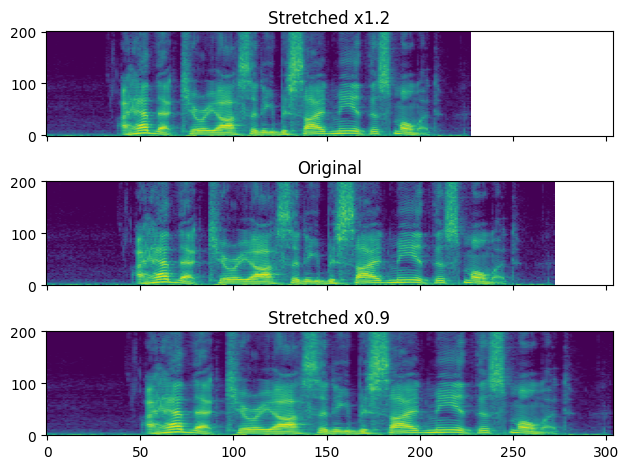

In [ ]:
def plot():
    def plot_spec(ax, spec, title):
        ax.set_title(title)
        ax.imshow(librosa.amplitude_to_db(spec), origin="lower", aspect="auto")

    fig, axes = plt.subplots(3, 1, sharex=True, sharey=True)
    plot_spec(axes[0], torch.abs(spec_12[0]), title="Stretched x1.2")
    plot_spec(axes[1], torch.abs(spec[0]), title="Original")
    plot_spec(axes[2], torch.abs(spec_09[0]), title="Stretched x0.9")
    fig.tight_layout()


plot()

## TimeMasking


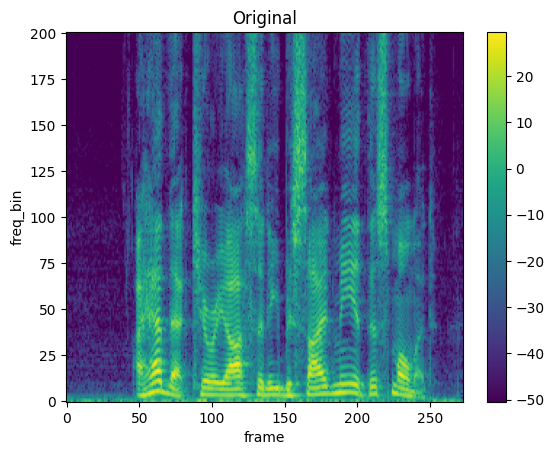

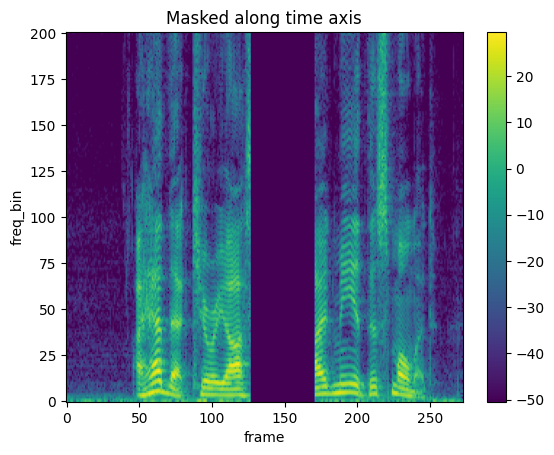

In [ ]:
torch.random.manual_seed(4)

spec = get_spectrogram()
plot_spectrogram(spec[0], title="Original")

masking = T.TimeMasking(time_mask_param=80)
spec = masking(spec)

plot_spectrogram(spec[0], title="Masked along time axis")

## FrequencyMasking


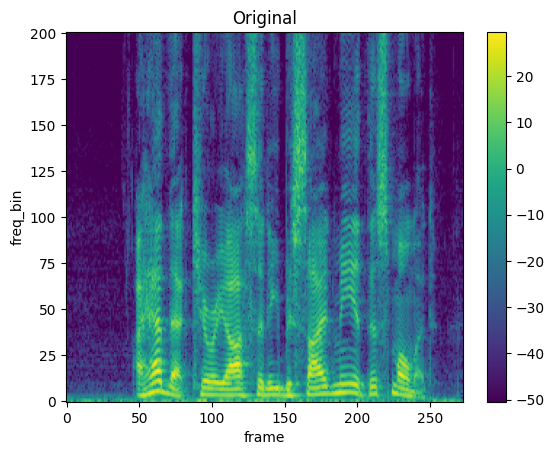

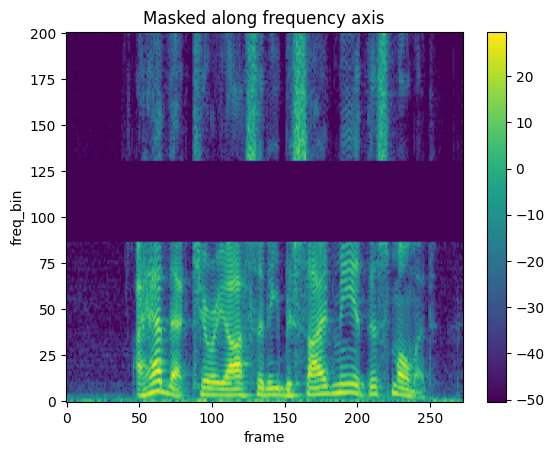

In [ ]:
torch.random.manual_seed(4)

spec = get_spectrogram()
plot_spectrogram(spec[0], title="Original")

masking = T.FrequencyMasking(freq_mask_param=80)
spec = masking(spec)

plot_spectrogram(spec[0], title="Masked along frequency axis")